# PART B - Conditional GAN

In this second half, I will construct a conditional generative adversarial network for our image colourization task.

## Part 1 Conditional GAN

To start I will be modifying the previous sample code to construct and train a conditional GAN.


### Part (i)
Modify the provided training code to implement a generator. Then test to verify it works on the desired input

In [ ]:
class Generator(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=3, num_in_channels=1):
        super().__init__()

        # Useful parameters
        padding = kernel // 2

        ###################################################
        self.downconv1 = nn.Sequential(
            nn.Conv2d(num_in_channels, num_filters, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2))

        self.downconv2 = nn.Sequential(
            nn.Conv2d(num_filters, num_filters*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*2),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2))

        self.downconv3 = nn.Sequential(
            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2))

        self.downconv4 = nn.Sequential(
            nn.Conv2d(num_filters*4, num_filters*8, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*8),
            nn.LeakyReLU(0.2),
            nn.MaxPool2d(2))

        self.rfconv = nn.Sequential(
            nn.Conv2d(num_filters*8, num_filters*8, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*8),
            nn.LeakyReLU(0.2))

        self.upconv1 = nn.Sequential(
            nn.Conv2d(num_filters*8*2, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        self.upconv2 = nn.Sequential(
            nn.Conv2d(num_filters*4*2, num_filters*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        self.upconv3 = nn.Sequential(
            nn.Conv2d(num_filters*2*2, num_filters, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        self.upconv4 = nn.Sequential(
            nn.Conv2d(num_filters*2, num_colours, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_colours),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        self.finalconv = nn.Sequential(
            nn.Conv2d(num_colours+num_in_channels, num_colours, kernel_size=kernel, padding=padding),
            nn.Tanh())

    def forward(self, x):

        ###################################################
        out1 = self.downconv1(x)
        out2 = self.downconv2(out1)
        out3 = self.downconv3(out2)
        out4 = self.downconv4(out3)
        out5 = self.rfconv(out4)
        out6 = self.upconv1(torch.cat([out5, out4], dim=1))
        out7 = self.upconv2(torch.cat([out6, out3], dim=1))
        out8 = self.upconv3(torch.cat([out7, out2], dim=1))
        out9 = self.upconv4(torch.cat([out8, out1], dim=1))
        out10 = self.finalconv(torch.cat([out9, x], dim=1))
        return out10

Write code to test the generator is working as intended.

In [ ]:
# Initialize the discriminator
gen =  Generator(kernel= 3, num_filters = 16)

# Pass in random input
x = torch.randn((5, 1, 16, 16))
output = gen(x)

# Check shape, should be [5,3,16,16] since we turn 5 grayscale images into 5 color images
print(output.shape)

torch.Size([5, 3, 16, 16])


### Part (ii)
Modify the provided training code to implement a discriminator. Then test to verify it works on the desired input.


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=3, num_in_channels=1):
        super().__init__()

        # Useful parameters
        stride = 2
        padding = kernel // 2
        output_padding = 1

        ###################################################
        self.model = nn.Sequential(
            nn.Conv2d(num_in_channels+num_colours, num_filters, kernel_size=kernel, padding=padding),  #num_in_channels+num_colours because input two images
            nn.LeakyReLU(0.2),

            nn.Conv2d(num_filters, num_filters*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*2),
            nn.LeakyReLU(0.2),

            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.LeakyReLU(0.2),

            nn.Conv2d(num_filters*4, num_filters*8, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*8),
            nn.LeakyReLU(0.2),

            nn.Conv2d(num_filters*8, 1, kernel_size=kernel, padding=padding)  # binary output for real/fake classification
        )

    def forward(self, x, img_greyscale):

        ############### YOUR CODE GOES HERE ###############
        ###################################################
        input = torch.cat((x, img_greyscale), dim=1)
        out = self.model(input)
        return out

Write code to test that the discriminator is working as intended.

In [ ]:
# Initialize the discriminator
discriminator = Discriminator(kernel = 3, num_filters = 16)

# Pass in random input
x = torch.randn((1, 1, 32, 32))
y = torch.randn((1, 3, 32, 32))
output = discriminator(x, y)

# Check shape, should be [1,1,32,32] since it outputs probability for each patch
print(output.shape)

torch.Size([1, 1, 32, 32])


### Part (iii)
Modify the provided training code to implement the training needed for a conditional GAN.

In [ ]:
class AttrDict(dict):
    def __init__(self, *args, **kwargs):
        super(AttrDict, self).__init__(*args, **kwargs)
        self.__dict__ = self

def get_torch_vars(xs, ys, gpu=False):
    """
    Helper function to convert numpy arrays to pytorch tensors.
    If GPU is used, move the tensors to GPU.

    Args:
      xs (float numpy tenosor): greyscale input
      ys (int numpy tenosor): categorical labels
      gpu (bool): whether to move pytorch tensor to GPU
    Returns:
      Variable(xs), Variable(ys)
    """
    xs = torch.from_numpy(xs).float()
    ys = torch.from_numpy(ys).float() #--> ADDED for cGAN
    if gpu:
        xs = xs.cuda()
        ys = ys.cuda()
    return Variable(xs), Variable(ys)

def train(args, cnn=None):
    # Set the maximum number of threads to prevent crash in Teaching Labs
    torch.set_num_threads(5)

    # Numpy random seed
    npr.seed(args.seed)

    # Save directory
    save_dir = "outputs/" + args.experiment_name

    # LOAD THE COLOURS CATEGORIES

    # INPUT CHANNEL
    num_in_channels = 1 if not args.downsize_input else 3

    # LOAD THE MODEL
    if cnn is None:
        Net = globals()[args.model]
        cnn = Net(args.kernel, args.num_filters)
        discriminator = Discriminator(args.kernel, args.num_filters)

    # LOSS FUNCTION
    criterion = nn.BCEWithLogitsLoss()
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=args.learn_rate/100, weight_decay=0.7)
    g_optimizer = torch.optim.Adam(cnn.parameters(), lr=args.learn_rate)
    L1 = nn.L1Loss()

    # DATA
    print("Loading data...")
    (x_train, y_train), (x_test, y_test) = load_cifar10()

    print("Transforming data...")
    train_rgb, train_grey = process(x_train, y_train, downsize_input=args.downsize_input)
    test_rgb, test_grey = process(x_test, y_test, downsize_input=args.downsize_input)

    # Create the outputs folder if not created already
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    print("Beginning training ...")
    if args.gpu:
        cnn.cuda()
        discriminator.cuda()
    start = time.time()

    train_losses = []
    valid_losses = []
    valid_accs = []
    lr_sch1 = torch.optim.lr_scheduler.ExponentialLR(optimizer=g_optimizer, gamma=0.9)
    lr_sch2 = torch.optim.lr_scheduler.ExponentialLR(optimizer=d_optimizer, gamma=0.9)

    for epoch in range(args.epochs):
        # Train the Model
        cnn.train()
        discriminator.train()
        losses = []

        for i, (xs, ys) in enumerate(get_batch(train_grey, train_rgb, args.batch_size)):
            images, labels = get_torch_vars(xs, ys, args.gpu)

            #--->ADDED 5
            img_grey = images
            img_real = labels
            batch_size = args.batch_size

            #discriminator training

            # train with real images
            real_output = discriminator(img_real, img_grey)
            real_loss = criterion(real_output, torch.ones_like(real_output))

            # train with fake images
            fake_images = cnn(img_grey)
            fake_output = discriminator(fake_images.detach(), img_grey)
            fake_loss = criterion(fake_output, torch.zeros_like(fake_output))

            d_loss = (real_loss + fake_loss)/2
            d_optimizer.zero_grad()
            d_loss.backward()
            d_optimizer.step()

            # generator training
            g_output = discriminator(fake_images, img_grey)  # prediction on fake images
            g_loss = criterion(g_output, torch.ones_like(g_output)) + L1(fake_images, img_real)*3 #fake:0; real:1

            g_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()
            outputs = fake_images

        #lr_sch1.step()
        lr_sch2.step()
        # print and visualize
        print(epoch, g_loss.cpu().detach(), d_loss.cpu().detach())
        visual(images, labels, outputs, args.gpu, 1)

        #save the best model
        torch.save(cnn.state_dict(), 'model{}.pth'.format(epoch))

    return cnn

### Part (iv)
Train a conditional GAN for image colourization and comment on how the results compare to the autoencoder architectures from part 1.

Loading data...
File path: data/cifar-10-batches-py.tar.gz
Transforming data...
Beginning training ...
0 tensor(0.9193) tensor(0.7022)


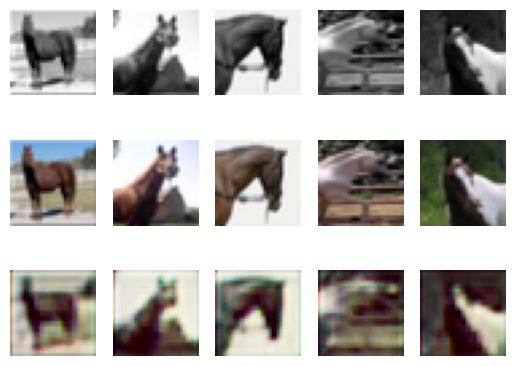

1 tensor(0.8962) tensor(0.7000)


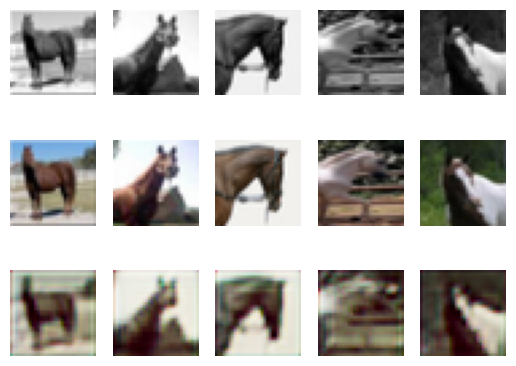

2 tensor(0.8817) tensor(0.6986)


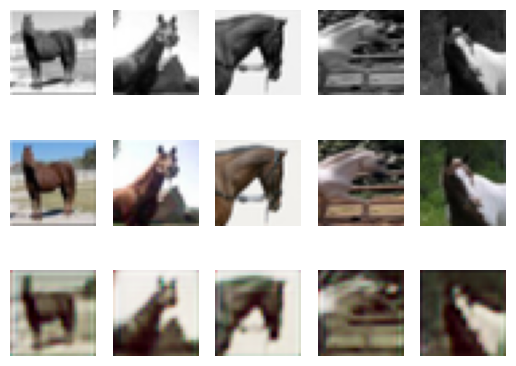

3 tensor(0.8689) tensor(0.6980)


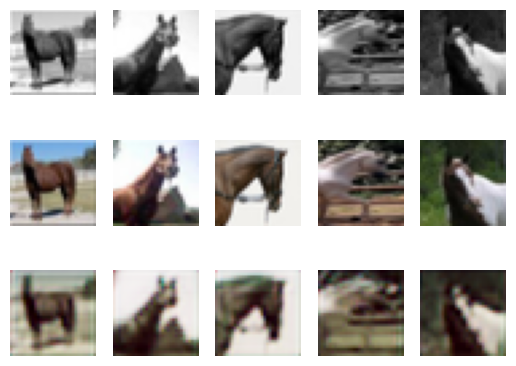

4 tensor(0.8609) tensor(0.6975)


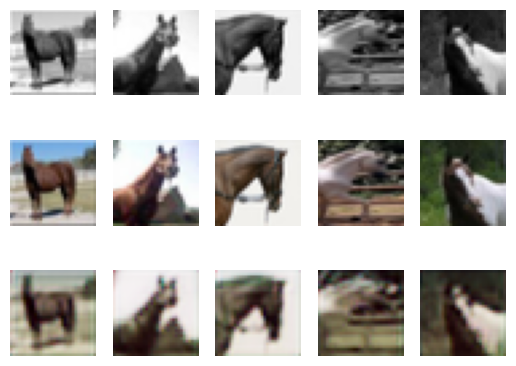

5 tensor(0.8556) tensor(0.6970)


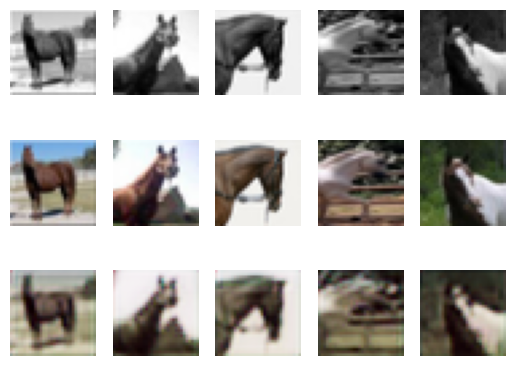

6 tensor(0.8518) tensor(0.6967)


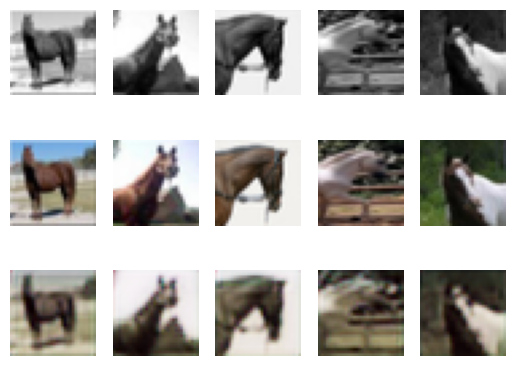

7 tensor(0.8489) tensor(0.6964)


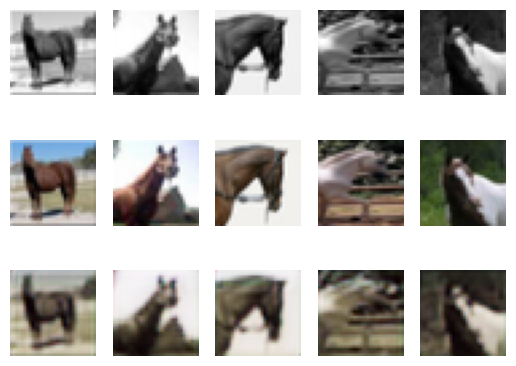

8 tensor(0.8451) tensor(0.6961)


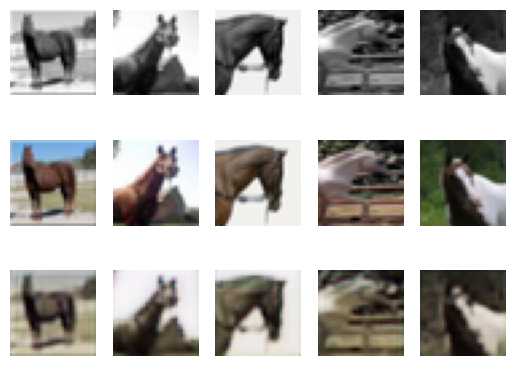

9 tensor(0.8417) tensor(0.6959)


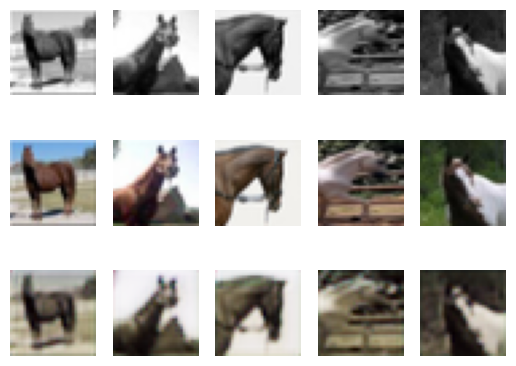

10 tensor(0.8382) tensor(0.6957)


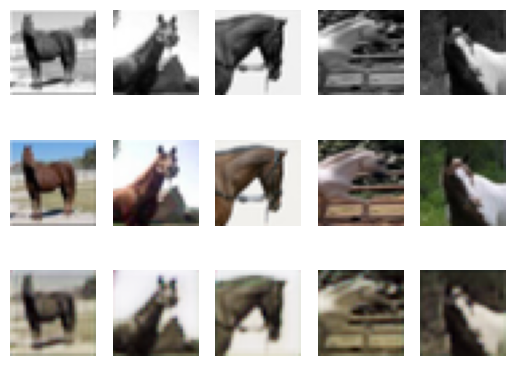

11 tensor(0.8369) tensor(0.6956)


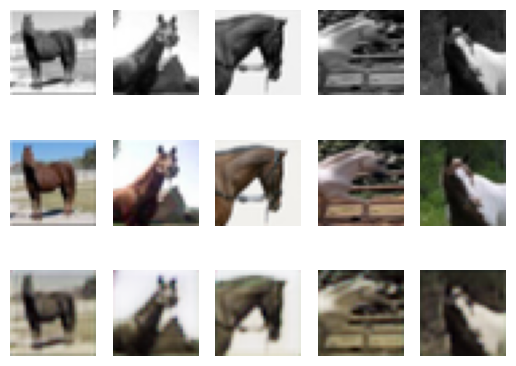

12 tensor(0.8347) tensor(0.6955)


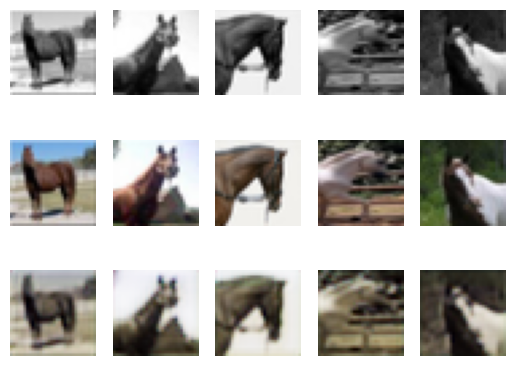

13 tensor(0.8321) tensor(0.6953)


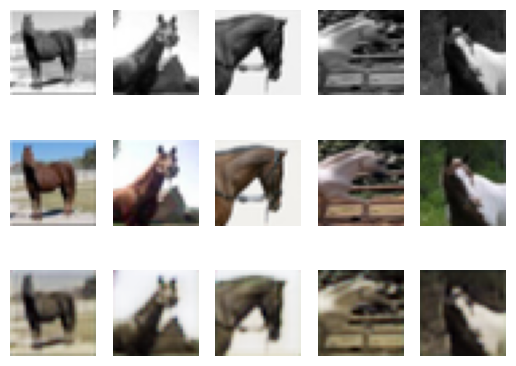

14 tensor(0.8320) tensor(0.6953)


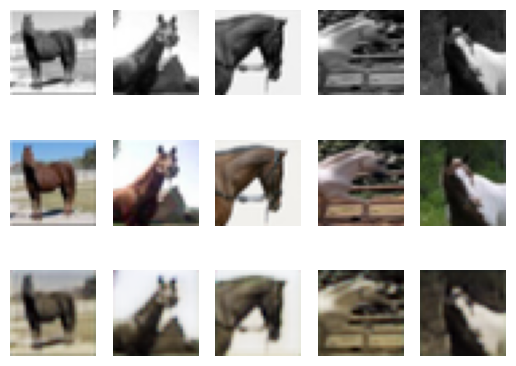

15 tensor(0.8272) tensor(0.6952)


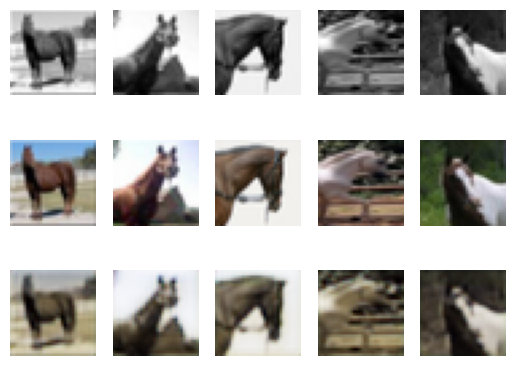

16 tensor(0.8261) tensor(0.6950)


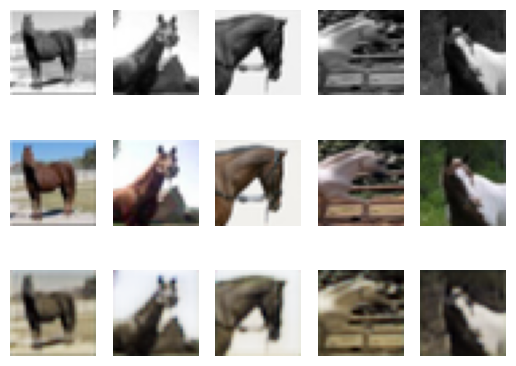

17 tensor(0.8231) tensor(0.6950)


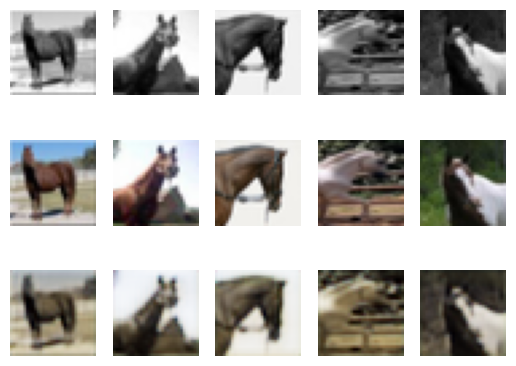

18 tensor(0.8210) tensor(0.6950)


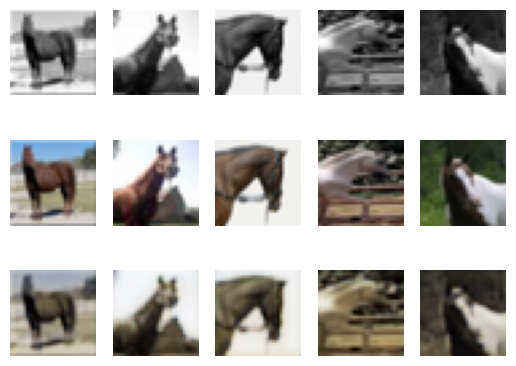

19 tensor(0.8183) tensor(0.6951)


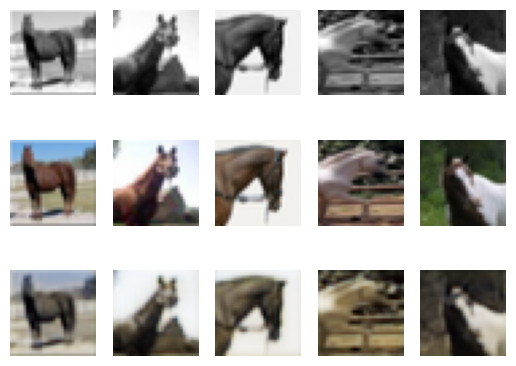

20 tensor(0.8159) tensor(0.6950)


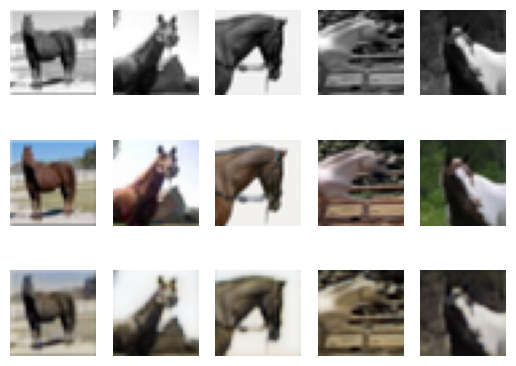

21 tensor(0.8134) tensor(0.6949)


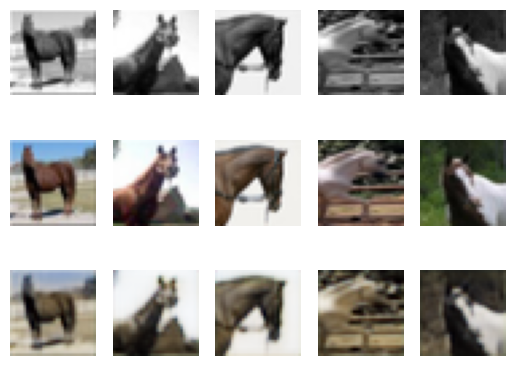

22 tensor(0.8115) tensor(0.6950)


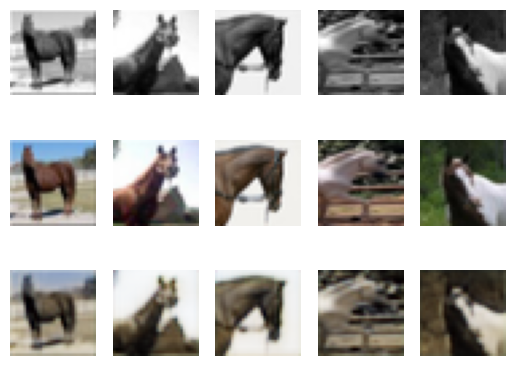

23 tensor(0.8104) tensor(0.6949)


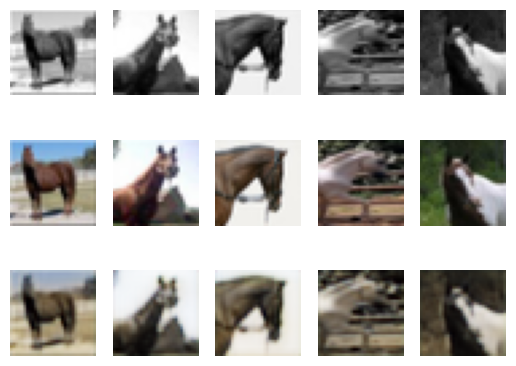

24 tensor(0.8090) tensor(0.6949)


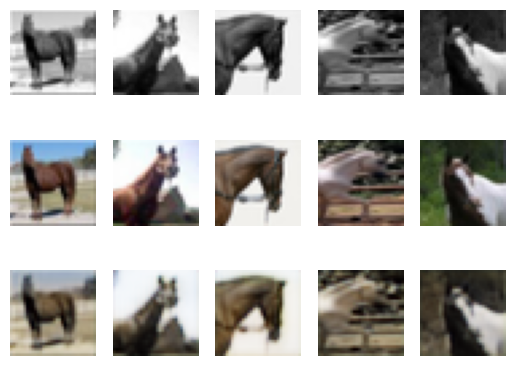

25 tensor(0.8087) tensor(0.6948)


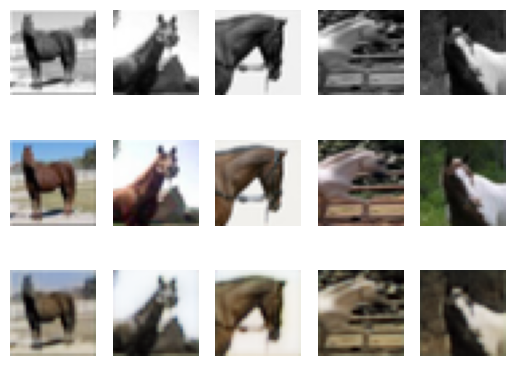

26 tensor(0.8067) tensor(0.6948)


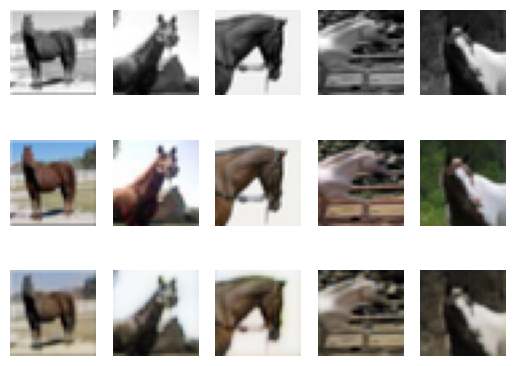

27 tensor(0.8048) tensor(0.6947)


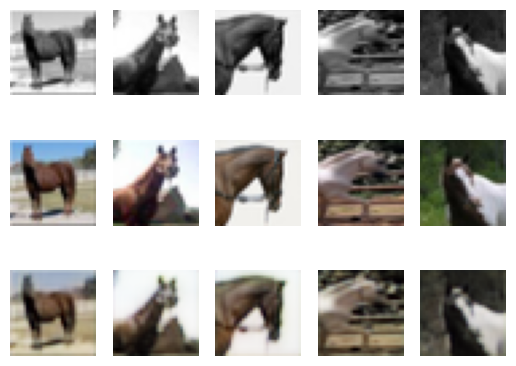

28 tensor(0.8016) tensor(0.6948)


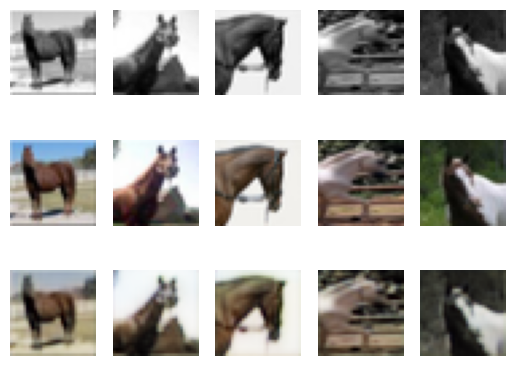

29 tensor(0.7983) tensor(0.6947)


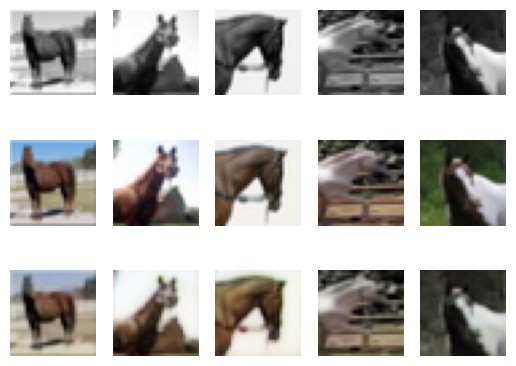

30 tensor(0.7968) tensor(0.6948)


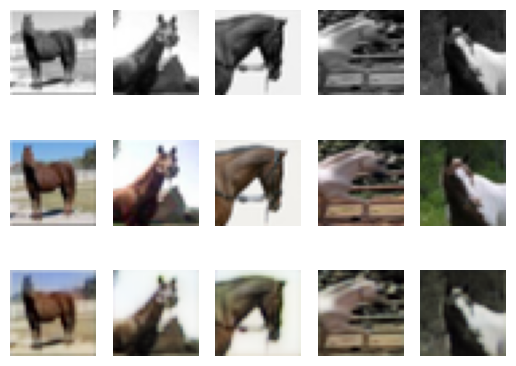

31 tensor(0.7963) tensor(0.6948)


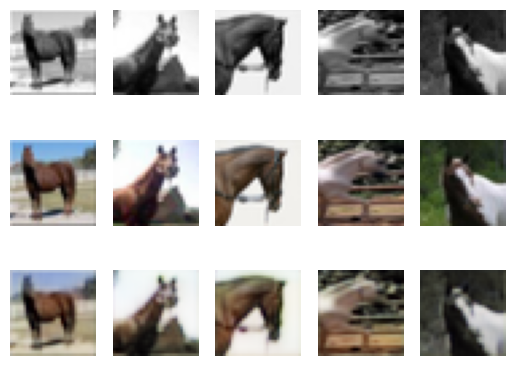

32 tensor(0.7943) tensor(0.6948)


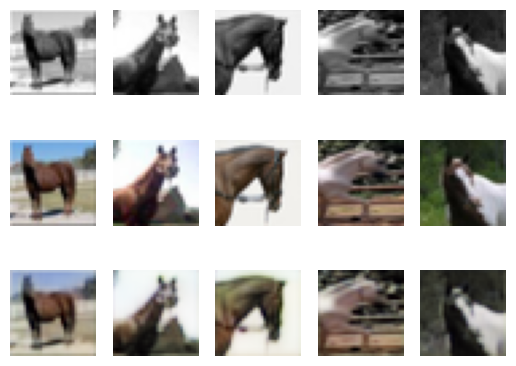

33 tensor(0.7950) tensor(0.6949)


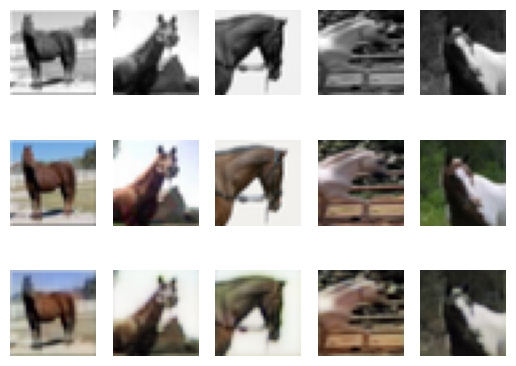

34 tensor(0.7934) tensor(0.6950)


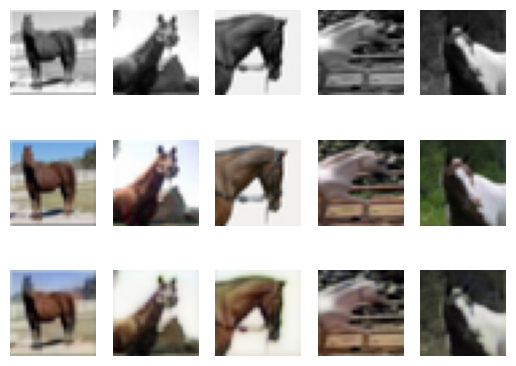

35 tensor(0.7924) tensor(0.6950)


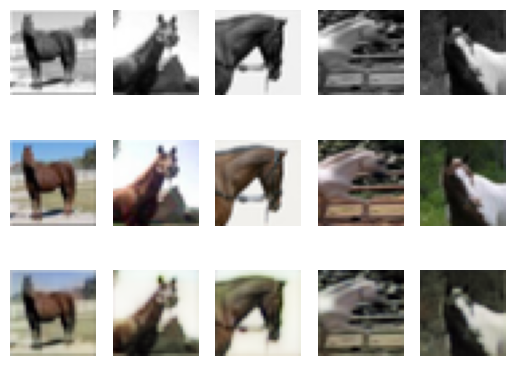

36 tensor(0.7923) tensor(0.6949)


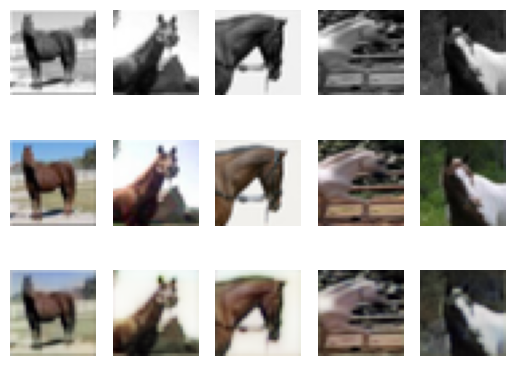

37 tensor(0.7923) tensor(0.6949)


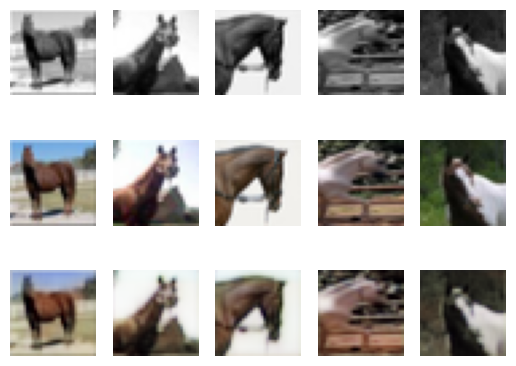

38 tensor(0.7920) tensor(0.6950)


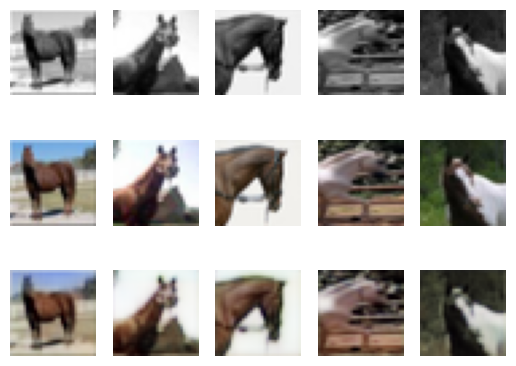

39 tensor(0.7879) tensor(0.6949)


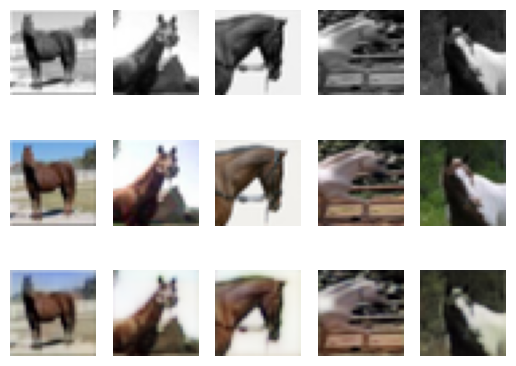

40 tensor(0.7862) tensor(0.6949)


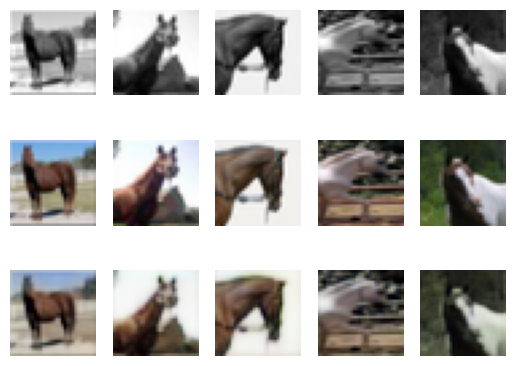

41 tensor(0.7853) tensor(0.6949)


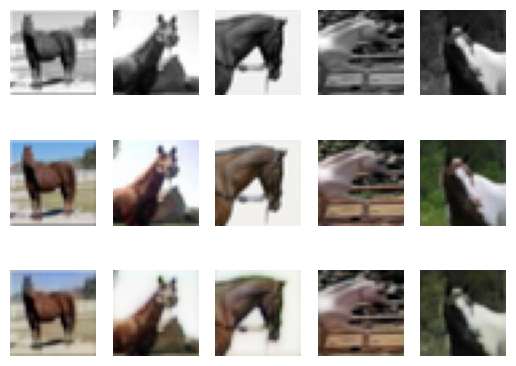

42 tensor(0.7873) tensor(0.6950)


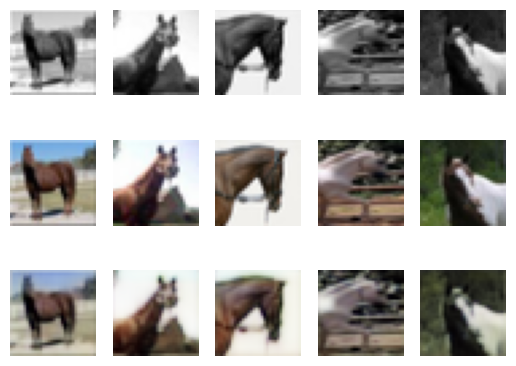

43 tensor(0.7881) tensor(0.6949)


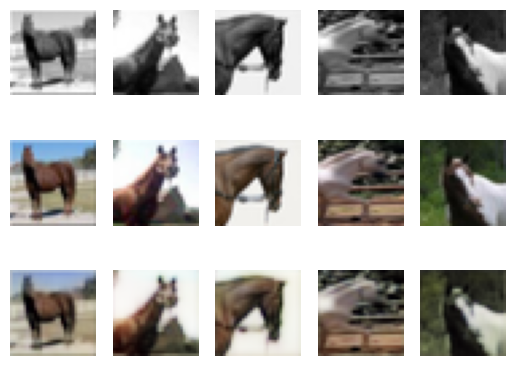

44 tensor(0.7944) tensor(0.6949)


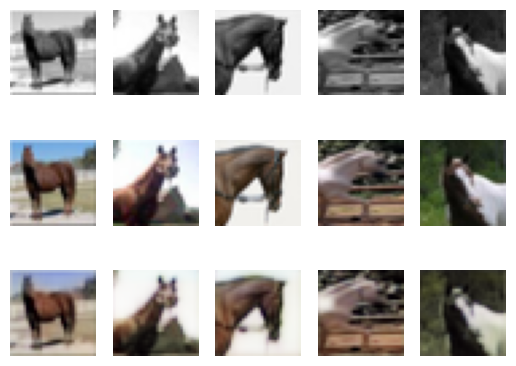

45 tensor(0.7892) tensor(0.6950)


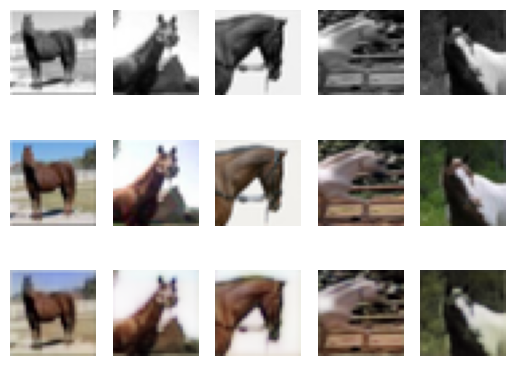

46 tensor(0.7854) tensor(0.6950)


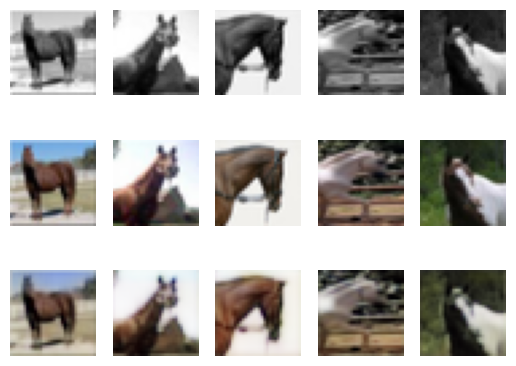

47 tensor(0.7835) tensor(0.6950)


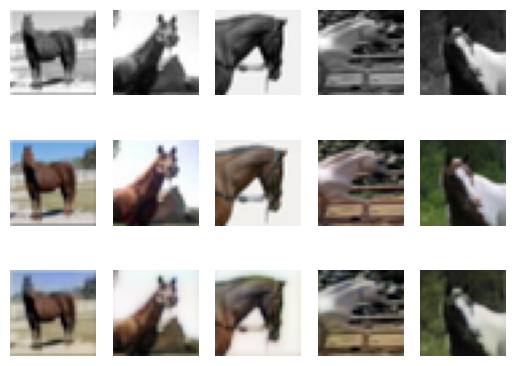

48 tensor(0.7842) tensor(0.6949)


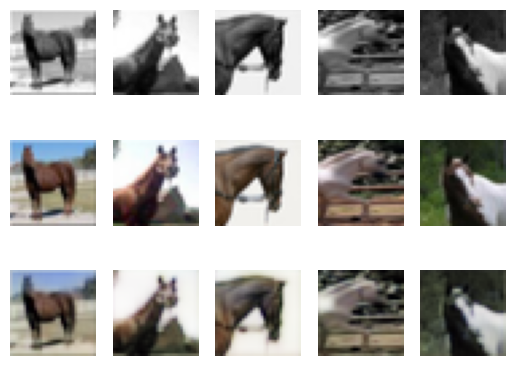

49 tensor(0.7808) tensor(0.6949)


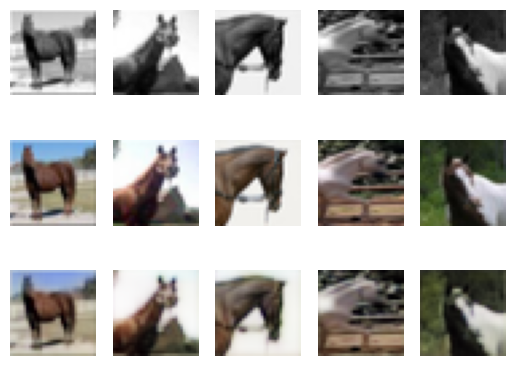

50 tensor(0.7839) tensor(0.6950)


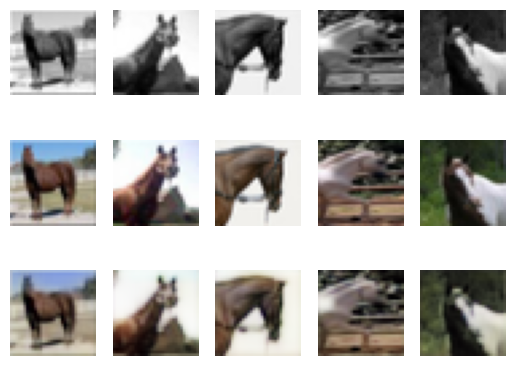

51 tensor(0.7856) tensor(0.6950)


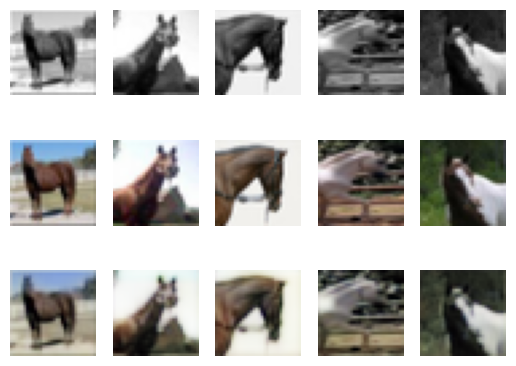

52 tensor(0.7834) tensor(0.6949)


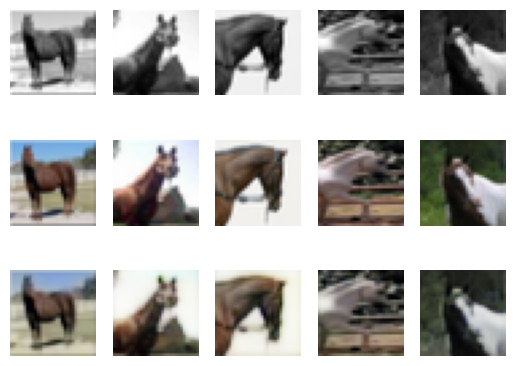

53 tensor(0.7824) tensor(0.6949)


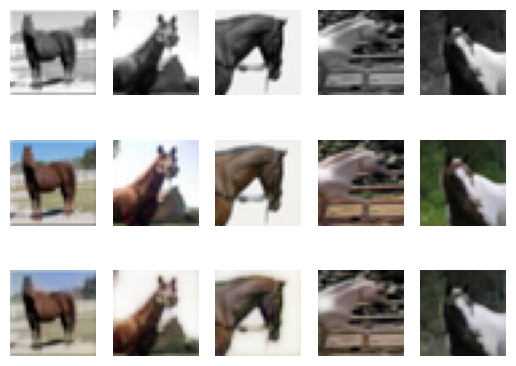

54 tensor(0.7861) tensor(0.6949)


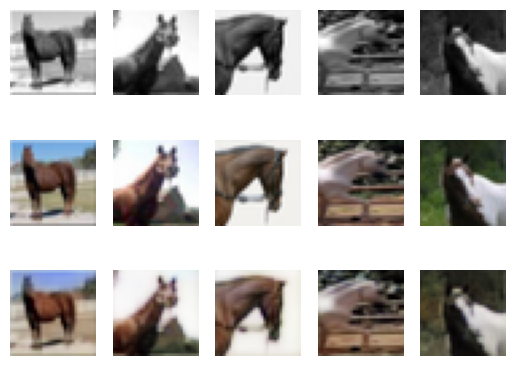

55 tensor(0.7816) tensor(0.6950)


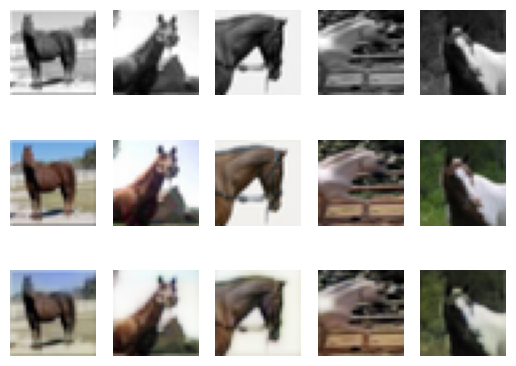

56 tensor(0.7839) tensor(0.6948)


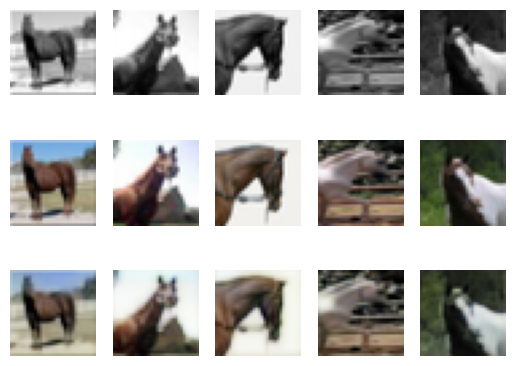

57 tensor(0.7802) tensor(0.6948)


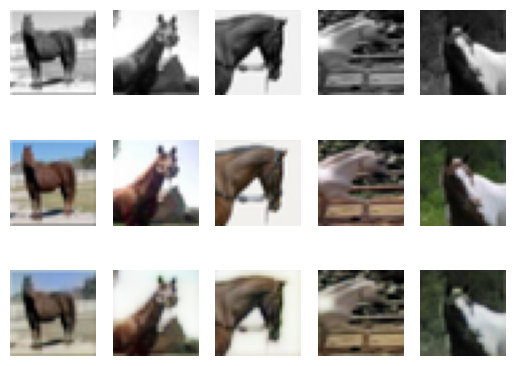

58 tensor(0.7793) tensor(0.6949)


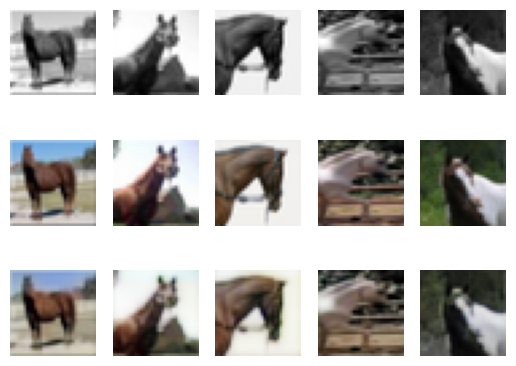

59 tensor(0.7804) tensor(0.6949)


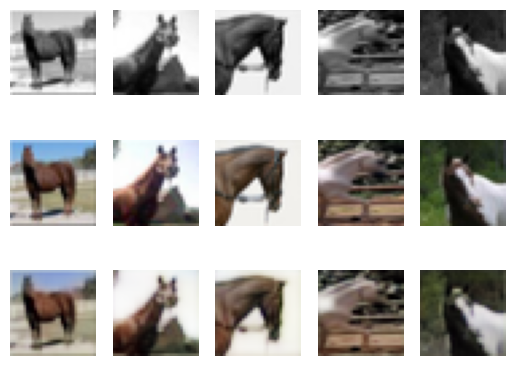

60 tensor(0.7876) tensor(0.6950)


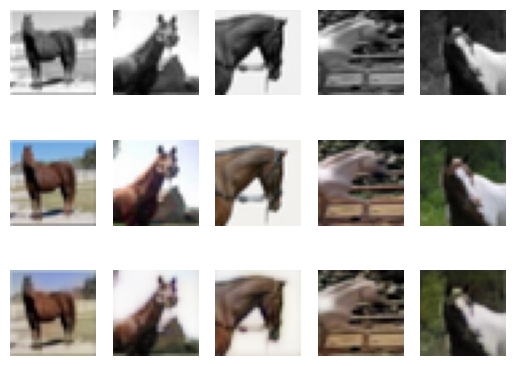

61 tensor(0.7861) tensor(0.6949)


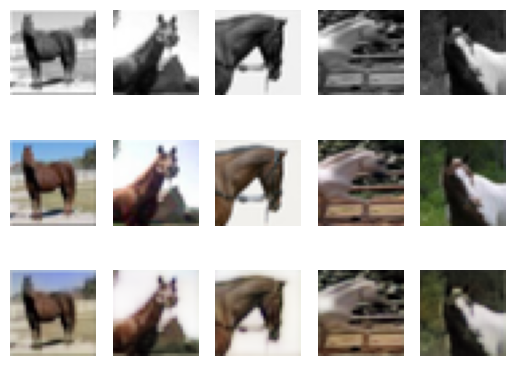

62 tensor(0.7800) tensor(0.6949)


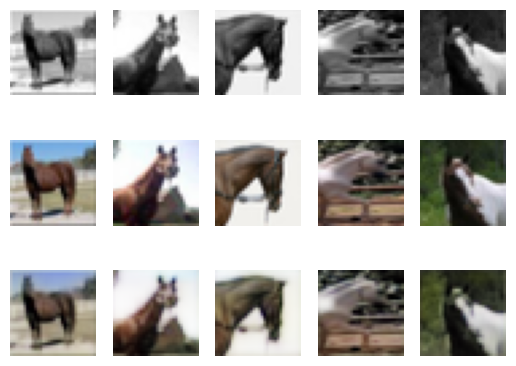

63 tensor(0.7790) tensor(0.6949)


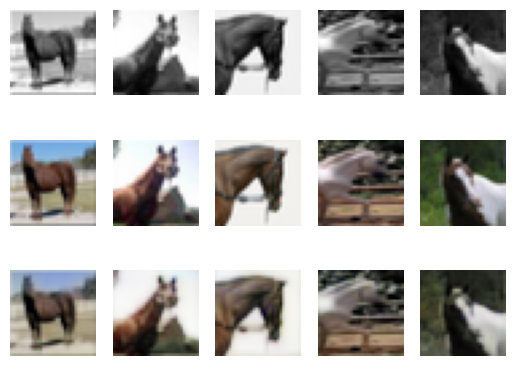

64 tensor(0.7794) tensor(0.6949)


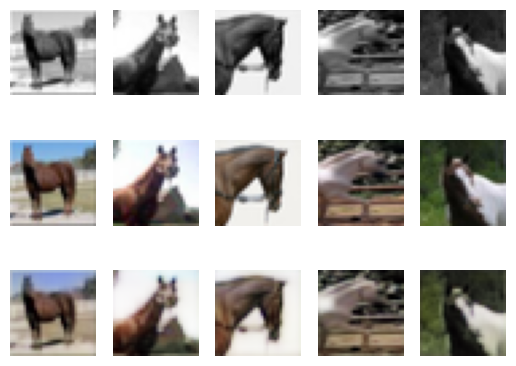

65 tensor(0.7785) tensor(0.6949)


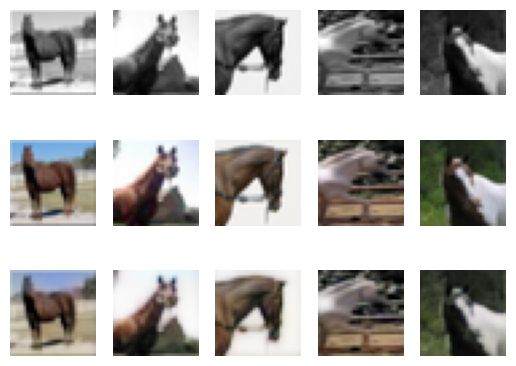

66 tensor(0.7782) tensor(0.6949)


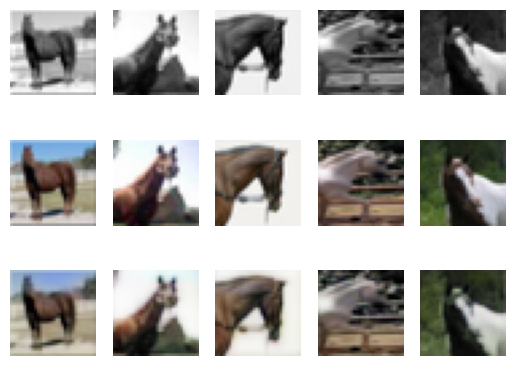

67 tensor(0.7784) tensor(0.6950)


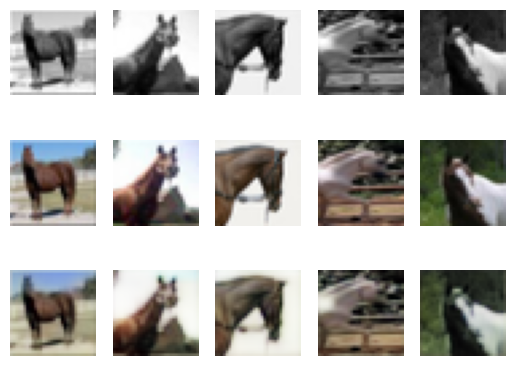

68 tensor(0.7801) tensor(0.6950)


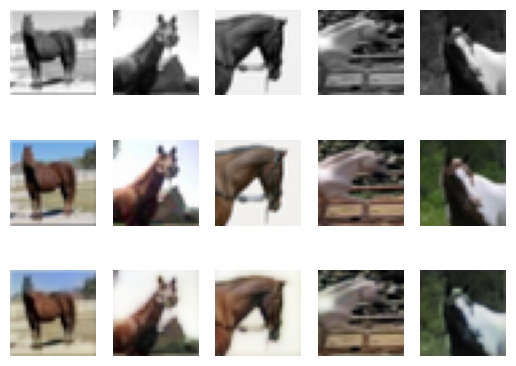

69 tensor(0.7806) tensor(0.6949)


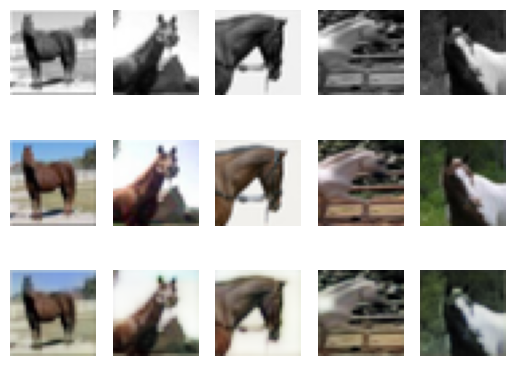

70 tensor(0.7767) tensor(0.6949)


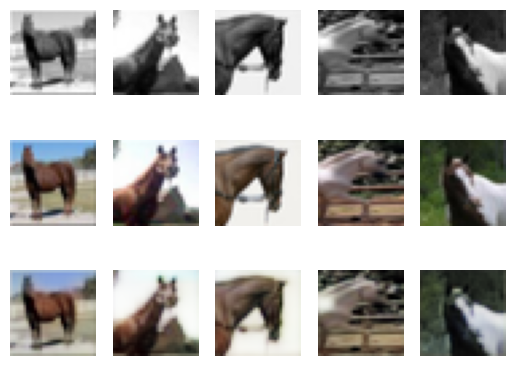

71 tensor(0.7776) tensor(0.6948)


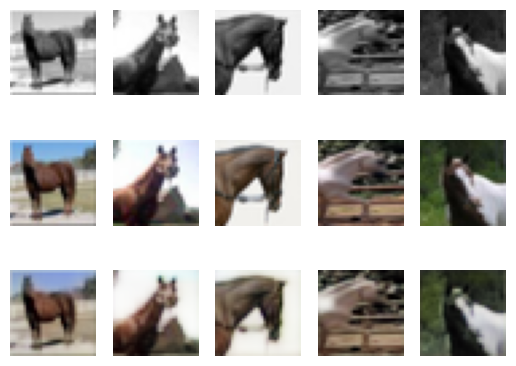

72 tensor(0.7823) tensor(0.6949)


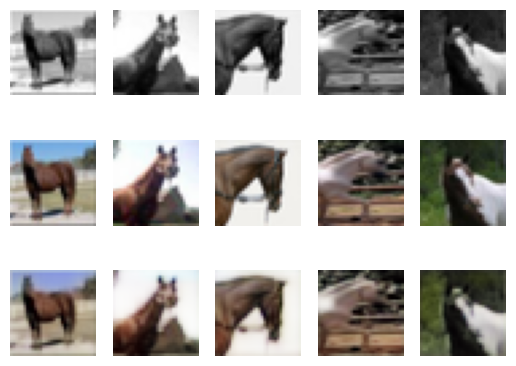

73 tensor(0.7827) tensor(0.6949)


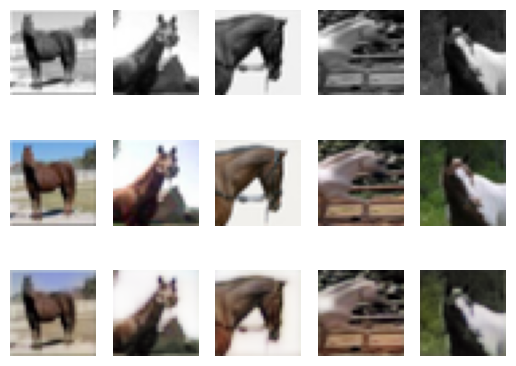

74 tensor(0.7792) tensor(0.6949)


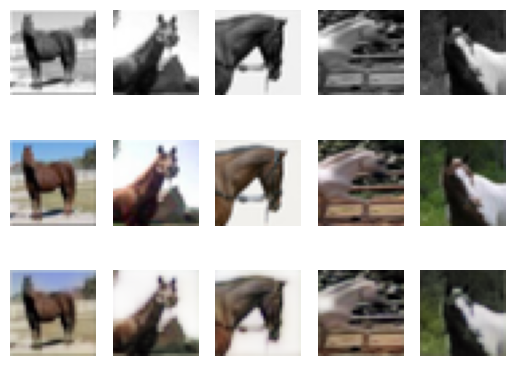

75 tensor(0.7799) tensor(0.6950)


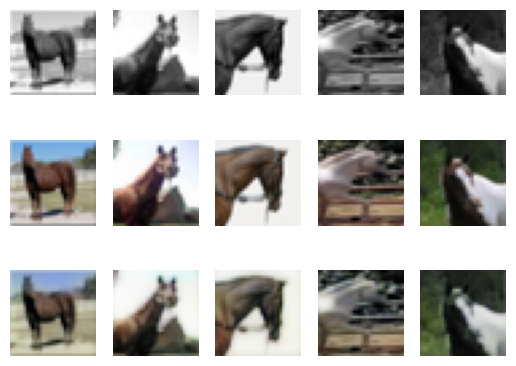

76 tensor(0.7792) tensor(0.6950)


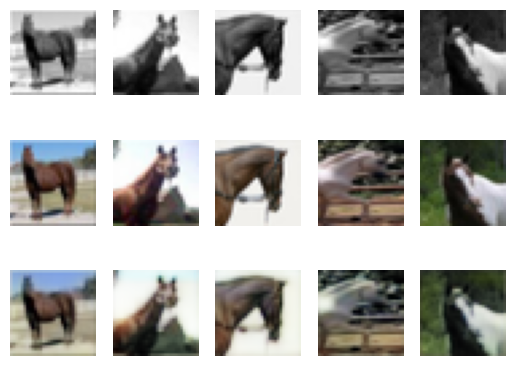

77 tensor(0.7801) tensor(0.6950)


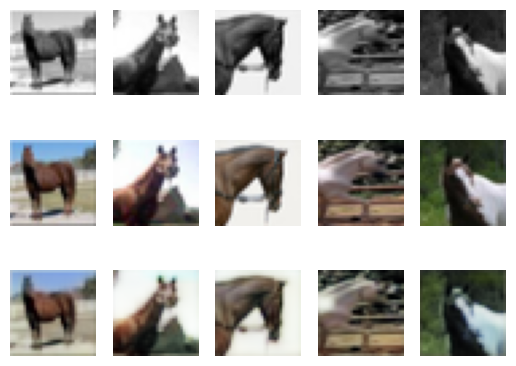

78 tensor(0.7765) tensor(0.6949)


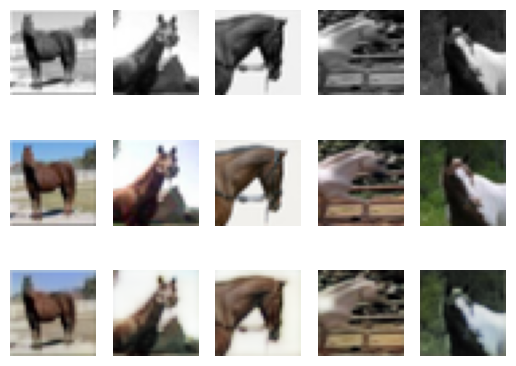

79 tensor(0.7754) tensor(0.6949)


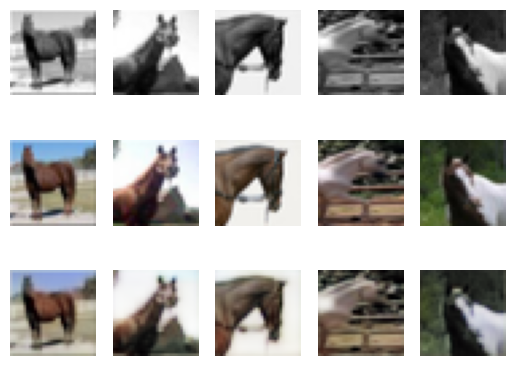

80 tensor(0.7773) tensor(0.6949)


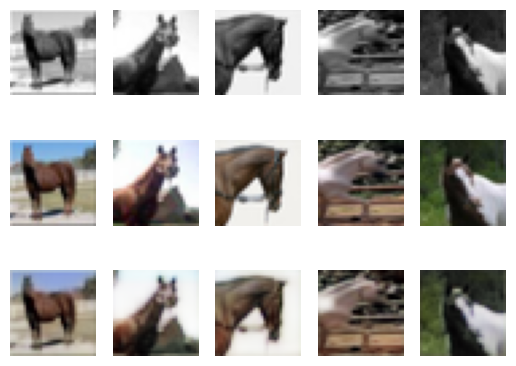

81 tensor(0.7772) tensor(0.6949)


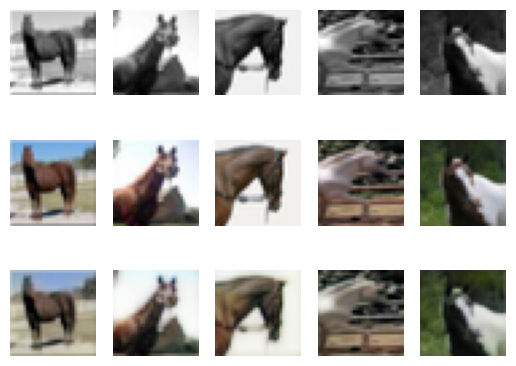

82 tensor(0.7727) tensor(0.6950)


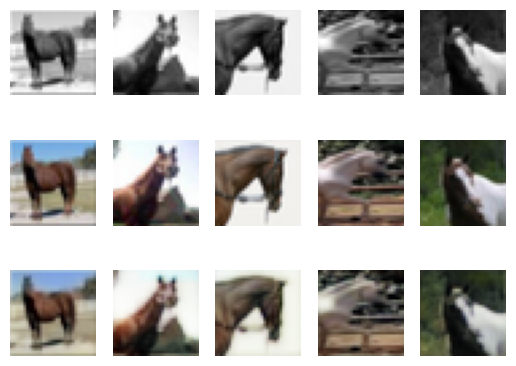

83 tensor(0.7757) tensor(0.6950)


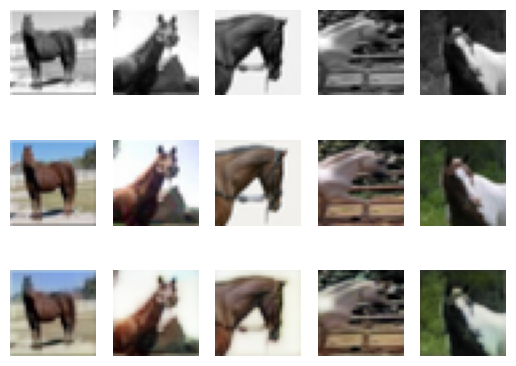

84 tensor(0.7725) tensor(0.6950)


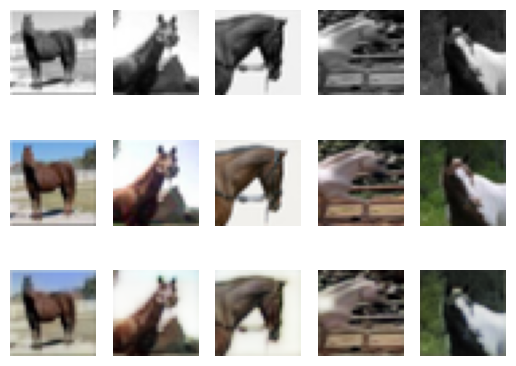

85 tensor(0.7708) tensor(0.6950)


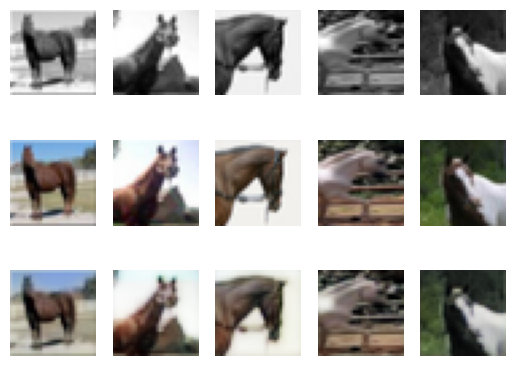

86 tensor(0.7710) tensor(0.6950)


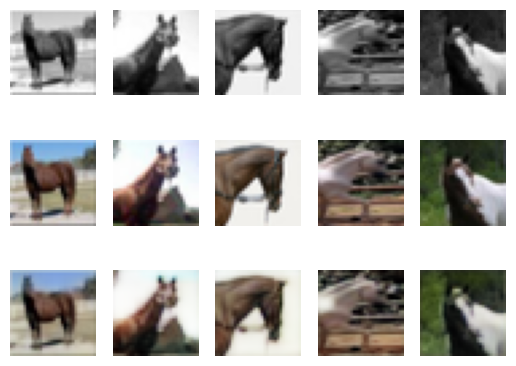

87 tensor(0.7732) tensor(0.6949)


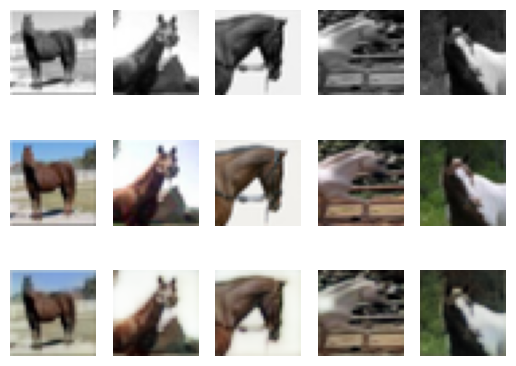

88 tensor(0.7738) tensor(0.6949)


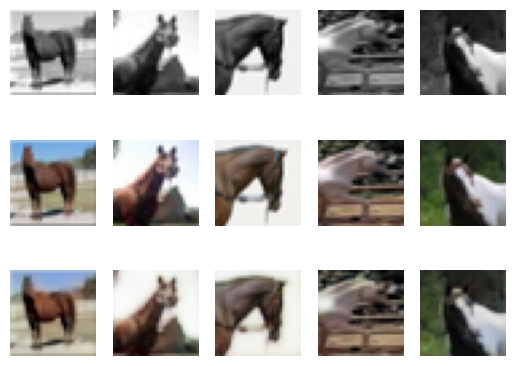

89 tensor(0.7750) tensor(0.6950)


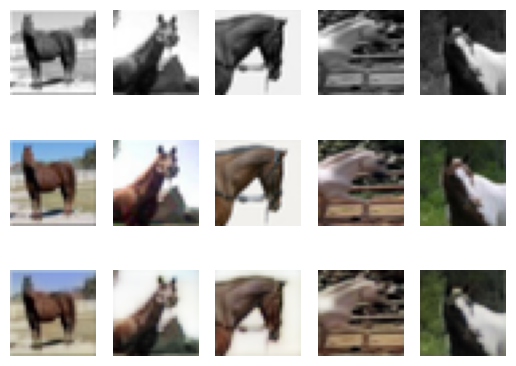

90 tensor(0.7710) tensor(0.6949)


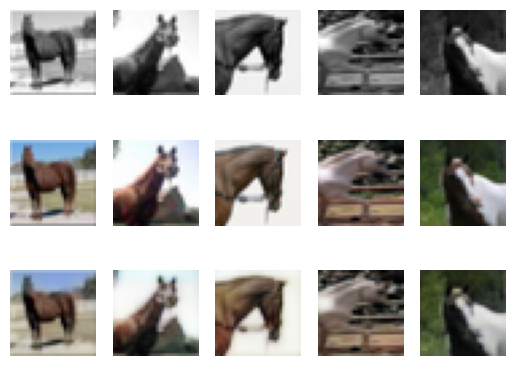

91 tensor(0.7714) tensor(0.6948)


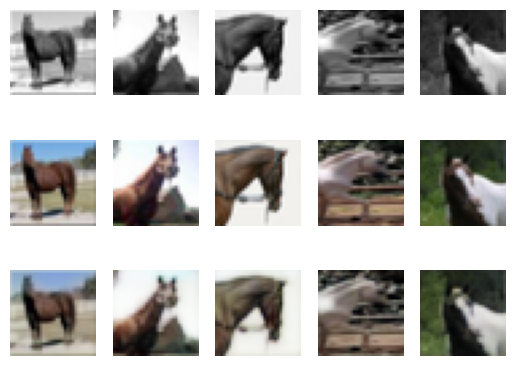

92 tensor(0.7797) tensor(0.6950)


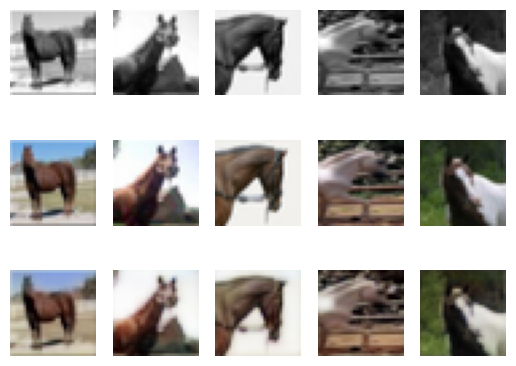

93 tensor(0.7717) tensor(0.6950)


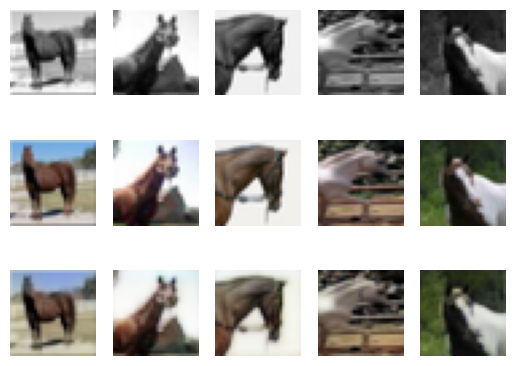

94 tensor(0.7710) tensor(0.6949)


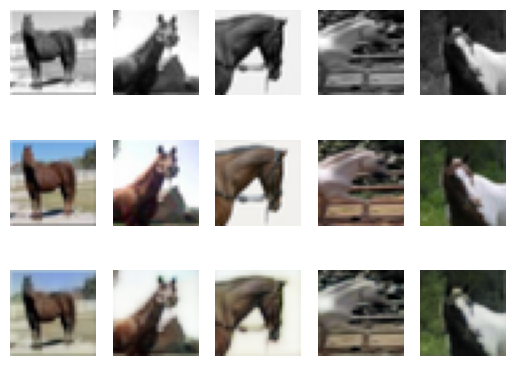

95 tensor(0.7694) tensor(0.6949)


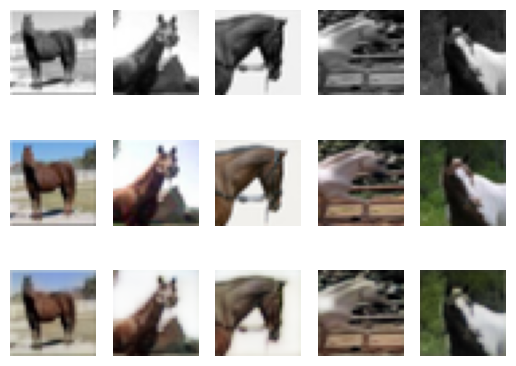

96 tensor(0.7751) tensor(0.6950)


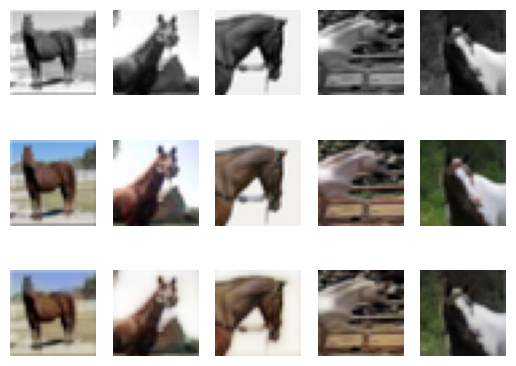

97 tensor(0.7711) tensor(0.6949)


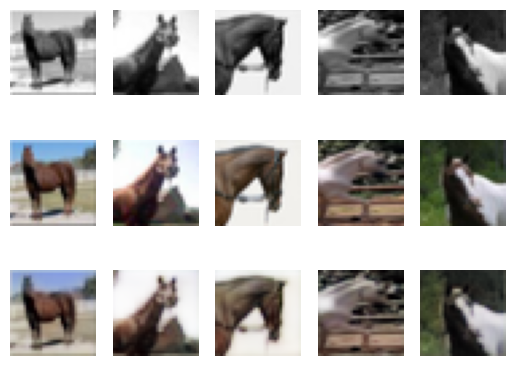

98 tensor(0.7721) tensor(0.6949)


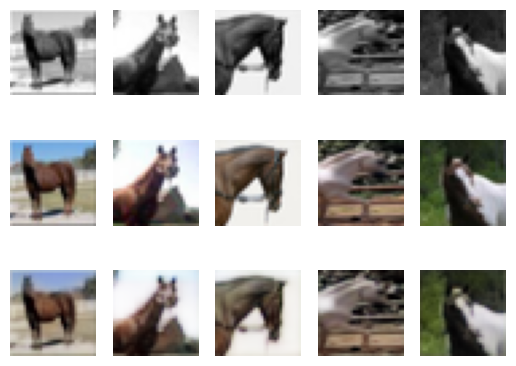

99 tensor(0.7731) tensor(0.6950)


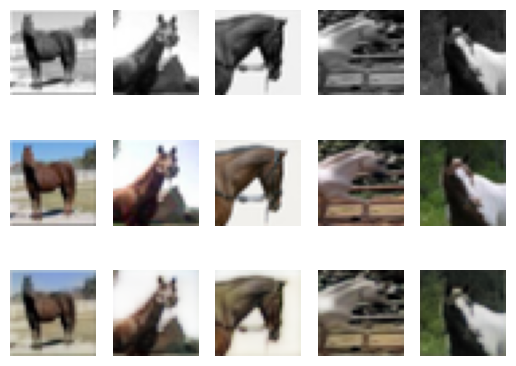

In [ ]:
args = AttrDict()
args_dict = {
    "gpu": True,
    "valid": False,
    "checkpoint": "",
    "colours": "./data/colours/colour_kmeans24_cat7.npy",
    "model": "Generator",
    "kernel": 3,
    "num_filters": 16,
    'learn_rate':0.001,
    "batch_size": 50,
    "epochs": 100,
    "seed": 0,
    "plot": False,
    "experiment_name": "colourization_cnn",
    "visualize": False,
    "downsize_input": False,
}
args.update(args_dict)
cnn = train(args)

#batch size of 50 with 100 epochs seamed to work

Results of conditional GAN is way better than results of autoencoder. There are more colors in generated images from conditional GAN and its colors are
more aligned to the real images. Generated images from conditional GAN are almost identical to the real images whereas generated images from autoencoder
are easy to find difference between them and real images.

### Part (v)

There are two ways to implement the conditional GAN. The first is a standard conditional GAN for which the generator is a decoder with an input that is random noise with a conditional. The second is the pix2pix architecture where the generator is a UNet architecture with a greyscale image input.

Briefly describe the pros and cons of the two different approaches in regards to the image colourization task.

Standard conditional GAN:
PROS: The model structure is simpler and would be easier to converge.
CONS: It may not be able to preserve as much context and stucture from images as Pix2Pix because of the random noise condition.

Pix2Pix:
PROS: Its UNet structure helps preserve details and structure in images and produce better images that are more aligned to the real colored images.
CONS: This makes model more complex and hence more computation is needed, which slows down the convergence process.

## Part 2 New Data

### Part (i)

I will retrieve sample pictures from online and demonstrate how well my best model performs. I will provide all my code, including any image processing that I need to perform, and provide outputs on all the greyscale images I tested. My outputs will show the greyscale images, ground truth, and model generated image.

**Sample 1: horse test data**

In [ ]:
# Load data
(x_train, y_train), (x_test, y_test) = load_cifar10()
test_rgb, test_grey = process(x_test, y_test)
xs, ys = next(get_batch(test_grey, test_rgb, 5)) # get 5 images to test
images, labels = get_torch_vars(xs, ys, True) # convert images into tensor

File path: data/cifar-10-batches-py.tar.gz


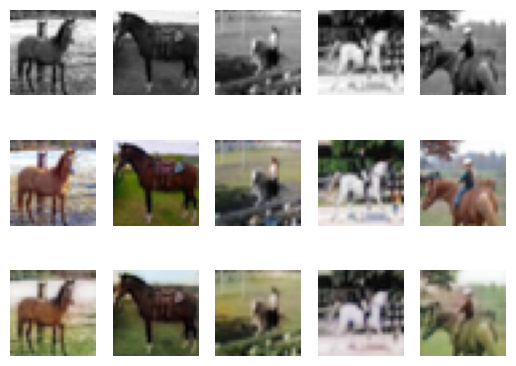

In [ ]:
# Load my best model
best_gen = Generator(kernel = 3, num_filters=16).to("cuda")
best_gen.load_state_dict(torch.load('model98.pth')) # my best model is at epoch 98 based on image quality and loss

# Generate color images
best_gen.eval()
with torch.no_grad():
  outputs = best_gen(images)
  visual(images, labels, outputs, True, 1)  # images: grayscale; labels: groundtruth; outputs: generated images

**Sample 2: other classes of cifar10 dataset**

In [ ]:
# convert colour images into greyscale
def process_others(xs, ys, max_pixel=256.0, downsize_input=False, category = 7):
    """
    Pre-process CIFAR10 images by taking only the horse category,
    shuffling, and have colour values be bound between 0 and 1

    Args:
      xs: the colour RGB pixel values
      ys: the category labels
      max_pixel: maximum pixel value in the original data
    Returns:
      xs: value normalized and shuffled colour images
      grey: greyscale images, also normalized so values are between 0 and 1
    """
    xs = xs / max_pixel
    xs = xs[np.where(ys == category)[0], :, :, :]
    npr.shuffle(xs)

    grey = np.mean(xs, axis=1, keepdims=True)

    if downsize_input:
        downsize_module = nn.Sequential(
            nn.AvgPool2d(2),
            nn.AvgPool2d(2),
            nn.Upsample(scale_factor=2),
            nn.Upsample(scale_factor=2),
        )
        xs_downsized = downsize_module.forward(torch.from_numpy(xs).float())
        xs_downsized = xs_downsized.data.numpy()
        return (xs, xs_downsized)
    else:
        return (xs, grey)

In [ ]:
# Load data
(x_train, y_train), (x_test, y_test) = load_cifar10()
test_rgb, test_grey = process_others(x_test, y_test, category = 1) # change category number to get other classes
xs, ys = next(get_batch(test_grey, test_rgb, 5)) # get 5 images to test
images, labels = get_torch_vars(xs, ys, True) # convert images into tensor

File path: data/cifar-10-batches-py.tar.gz


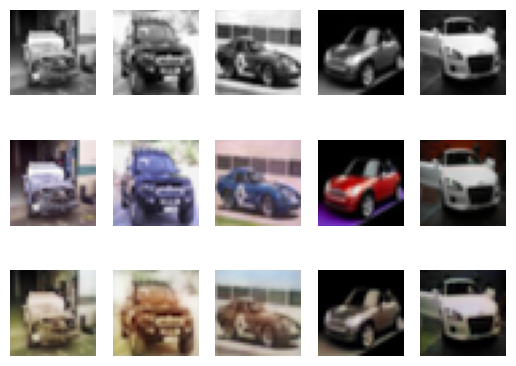

In [ ]:
# Load my best model
best_gen = Generator(kernel = 3, num_filters=16).to("cuda")
best_gen.load_state_dict(torch.load('model98.pth'))

# Generate color images
best_gen.eval()
with torch.no_grad():
  outputs = best_gen(images)
  visual(images, labels, outputs, True, 1)  # iamges: grayscale; labels: groundtruth; outputs: generated images

**Sample 3: landscape data from online**

In [ ]:
# I downloaded lanscape dataset from Kaggle: https://www.kaggle.com/datasets/theblackmamba31/landscape-image-colorization/
# The dataset has grayscale images as well as corresponding colored images
# I chose 5 images for testing and uploaded them to google drive
from google.colab import drive
import os
from PIL import Image

drive.mount('/content/gdrive')
data_path_color = '/content/gdrive/My Drive/Colab Notebooks/MIE1517/A3/test_data/color'
data_path_gray = '/content/gdrive/My Drive/Colab Notebooks/MIE1517/A3/test_data/gray'

# List all image files in the directory
image_files = os.listdir(data_path_color)

# Process colored images
color_images = []
for name in image_files:
  image_path = os.path.join(data_path_color, name)
  image = Image.open(image_path) #open one image
  image = image.resize((32, 32)) #adjust size
  img = np.array(image) #convert to numpy array
  color_images.append(img)
color_images = np.array(color_images)

# Process grayscale images for generating images
gray_images = []
for name in image_files:
  image_path = os.path.join(data_path_gray, name)
  image = Image.open(image_path) #open one image
  image = image.resize((32, 32)) #adjust size
  img = np.array(image) #convert to numpy array
  img = np.reshape(img, (1, 32, 32)) #reshape
  gray_images.append(img)
gray_images = np.array(gray_images)

# Process grayscale images for plotting
img_gray = []
for name in image_files:
  image_path = os.path.join(data_path_gray, name)
  image = Image.open(image_path) #open one image
  image = image.resize((32, 32)) #adjust size
  img = np.array(image) #convert to numpy array
  img_gray.append(img)
img_gray = np.array(img_gray)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Load my best model
best_gen = Generator(kernel = 3, num_filters=16).to("cuda")
best_gen.load_state_dict(torch.load('model99.pth'))

# Generate color images
best_gen.eval()
with torch.no_grad():
  outputs = best_gen(Variable(images.float().cuda()))
  outputs = outputs.cpu().detach().numpy()
  img_fake = np.transpose(outputs[:5, :, :, :], [0, 2, 3, 1])

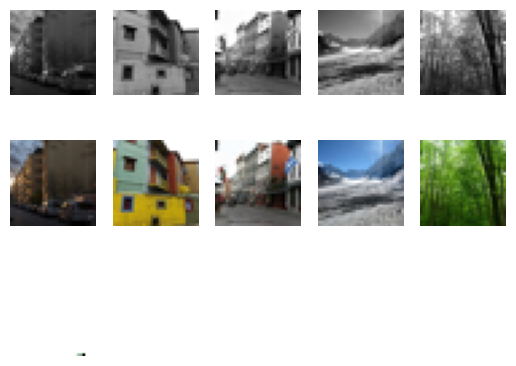

In [ ]:
for i in range(5):
      ax = plt.subplot(3, 5, i + 1)
      ax.imshow(img_gray[i], cmap='gray')
      ax.axis("off")
      ax = plt.subplot(3, 5, i + 1 + 5)
      ax.imshow(color_images[i])
      ax.axis("off")
      ax = plt.subplot(3, 5, i + 1 + 10)
      ax.imshow(np.clip(img_fake[i],0,1))
      ax.axis("off")
plt.show()

### Part (ii)





I tested my best model performance on new horse images, car images and landscape images. My model performs the best on horse data and the worst on
landscape data.
This is because my model is trained on horse data so it is familiar with spatial relationship, texture and color hue seen in horse images. For example,
colors like green, yellow, brown and white are frequently seen in horse images since horses are brown or white and background is often grass, so my model
colour these types colours well and the generated images are almost identical to groundtruth images.

When my model color car images, cars are still objects like horses but they often have bright color like red and blue, which are not frequently seen in
horse images, so my model didn't do well and the color of its generated images don't match with real images.

For landscape images, these are not objects, they often are just background in different location. These images have very different spatial relationship,
texture, lines and colors. Another reason is that the two previous data both come from cifar10 dataset with 32*32 resolution. But the landscape images
are high resolution images which are resized into low resolution images. My model is trained with low resolution images so it cannot capture many details
required in high resolution images and hence my model did really bad, it output almost nothing.

In [ ]:
%%shell
jupyter nbconvert --to html /content/Image_Colourization.ipynb

[NbConvertApp] Converting notebook /content/Image_Colourization.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 420 image(s).
[NbConvertApp] Writing 85051802 bytes to /content/Image_Colourization.html
